In [23]:
!python3 -V

Python 3.10.6


In [ ]:
# !python -m torch.distributed.launch --nproc_per_node=1 --use_env main.py --coco_path /path/to/coco 

In [1]:
from PIL import Image
import requests
import matplotlib.pyplot as plt
import numpy as np
import torch
import torchvision.transforms as T

# Dataset

In [2]:
from datasets.balloon import BalloonDatasetTrain, BalloonDatasetTest

len(BalloonDatasetTrain), len(BalloonDatasetTest)

(61, 13)

In [3]:
BalloonDatasetTrain.random_choice(3)

array([53, 20,  0])

idx = 13


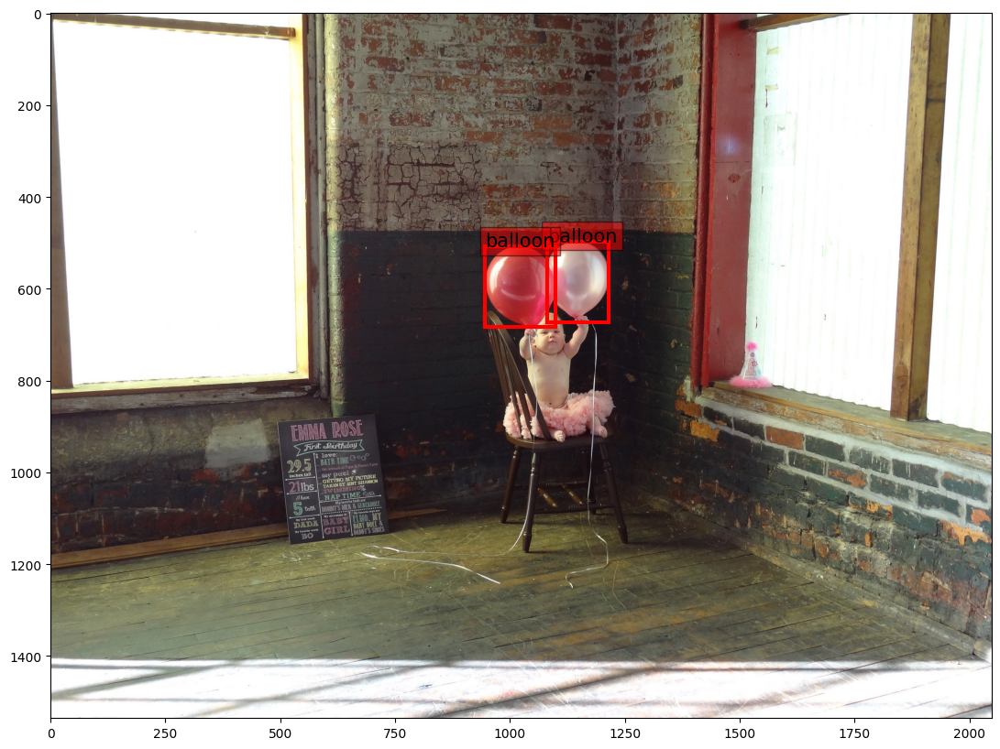

idx = 48


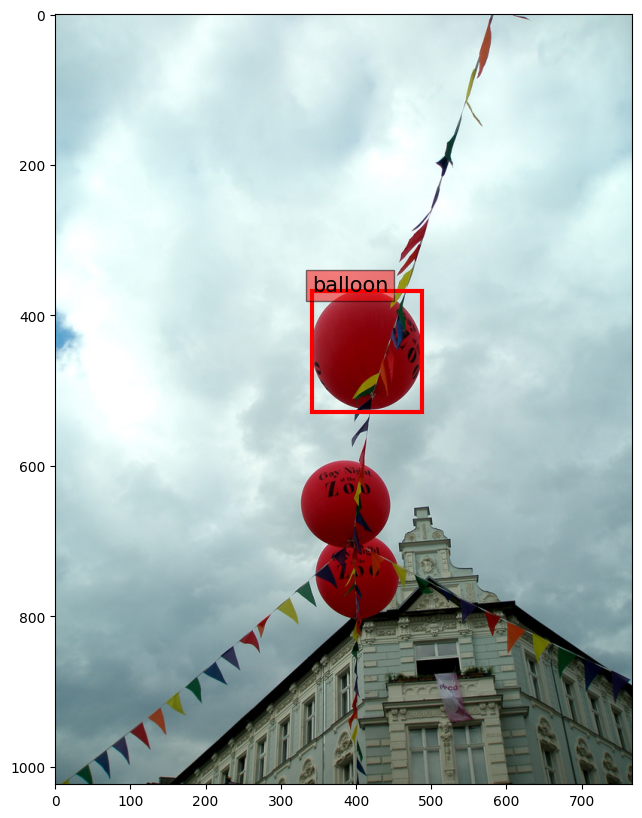

idx = 38


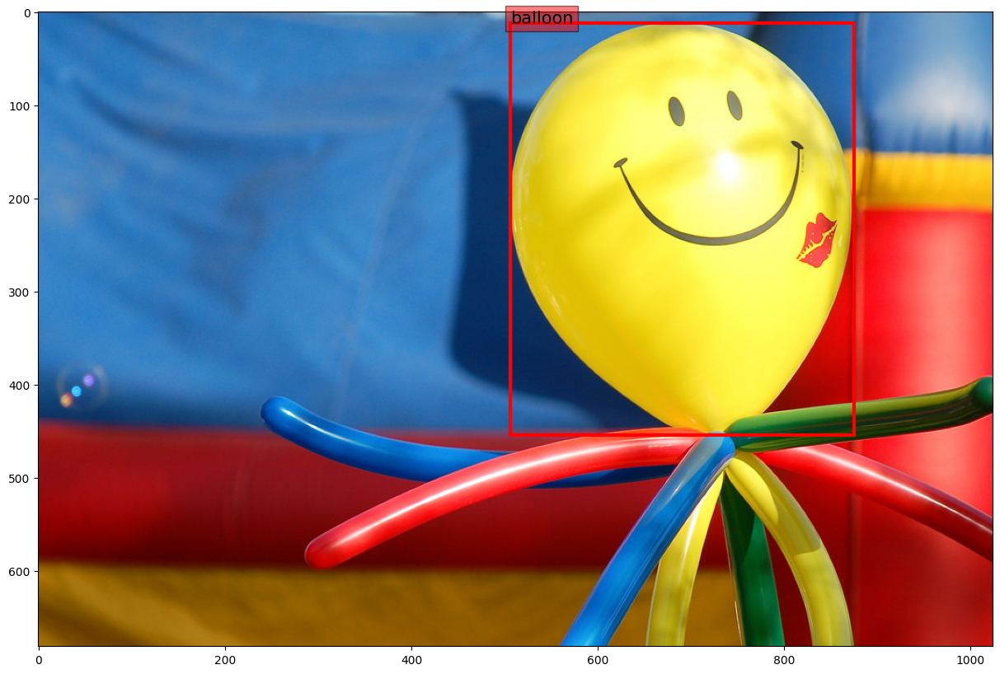

In [4]:
n_samples = 3
for idx in BalloonDatasetTrain.random_choice(n_samples):
    print(f"idx = {idx}")
    BalloonDatasetTrain.show_data(idx)
    plt.show()    

idx = 5


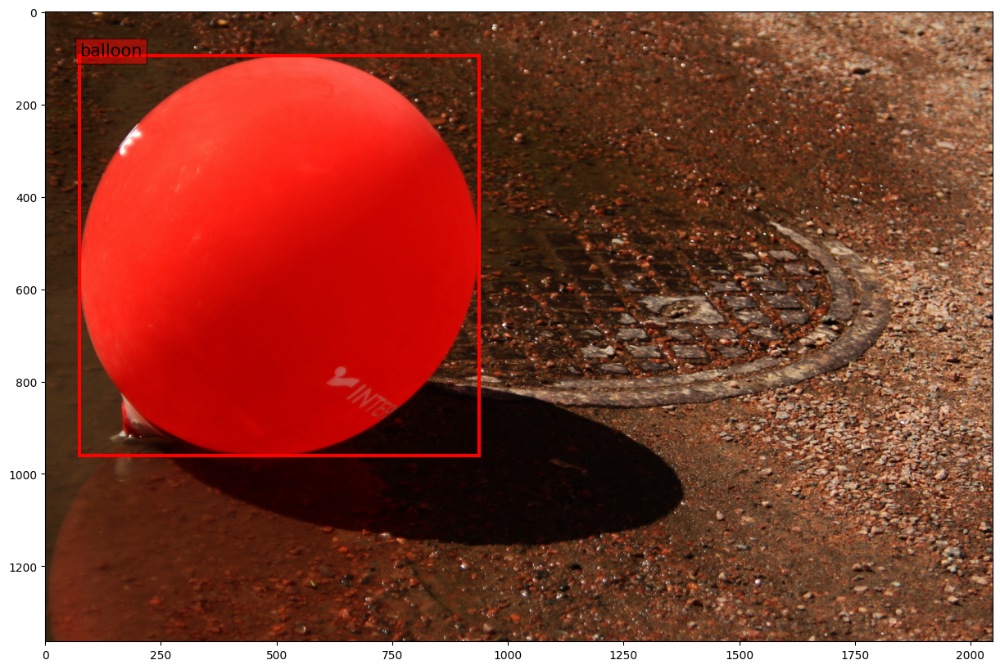

idx = 1


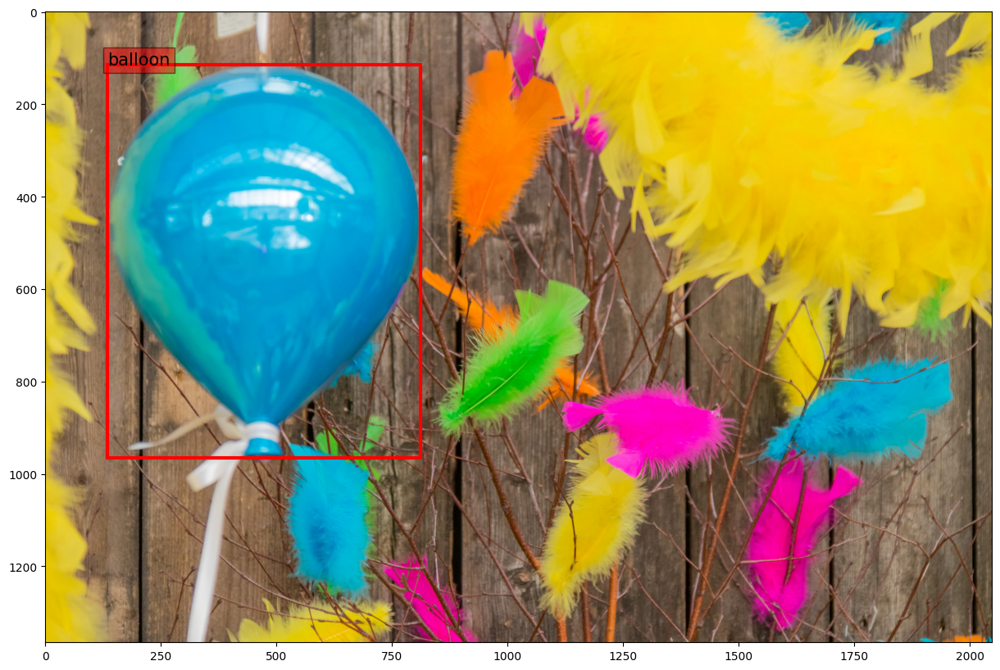

idx = 10


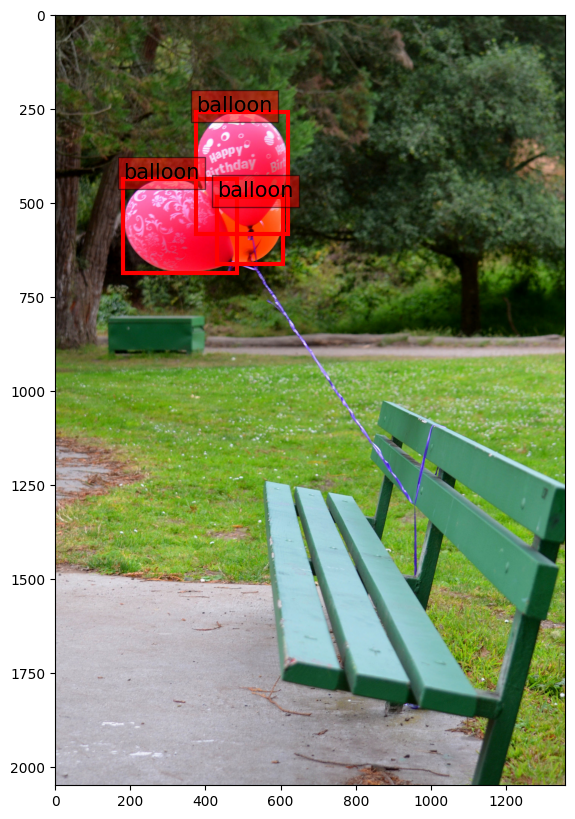

In [5]:
for idx in BalloonDatasetTest.random_choice(n_samples):
    print(f"idx = {idx}")
    BalloonDatasetTrain.show_data(idx)
    plt.show()    

# Model

In [39]:
model = torch.hub.load('facebookresearch/detr', 'detr_resnet50', pretrained=True)

Using cache found in /home/akaji/.cache/torch/hub/facebookresearch_detr_main
/home/akaji/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/akaji/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [44]:
import inspect

print(inspect.getsourcefile(model.forward))

/home/akaji/.cache/torch/hub/facebookresearch_detr_main/models/detr.py


In [42]:
model.class_embed

Linear(in_features=256, out_features=92, bias=True)

In [43]:
model.bbox_embed

MLP(
  (layers): ModuleList(
    (0-1): 2 x Linear(in_features=256, out_features=256, bias=True)
    (2): Linear(in_features=256, out_features=4, bias=True)
  )
)

## Fine-tuning
参考 [https://github.com/facebookresearch/detr/blob/main/main.py#L191]

```python
start_time = time.time()
    for epoch in range(args.start_epoch, args.epochs):
        if args.distributed:
            sampler_train.set_epoch(epoch)
        train_stats = train_one_epoch(
            model, criterion, data_loader_train, optimizer, device, epoch,
            args.clip_max_norm)
        lr_scheduler.step()
        if args.output_dir:
            checkpoint_paths = [output_dir / 'checkpoint.pth']
            # extra checkpoint before LR drop and every 100 epochs
            if (epoch + 1) % args.lr_drop == 0 or (epoch + 1) % 100 == 0:
                checkpoint_paths.append(output_dir / f'checkpoint{epoch:04}.pth')
            for checkpoint_path in checkpoint_paths:
                utils.save_on_master({
                    'model': model_without_ddp.state_dict(),
                    'optimizer': optimizer.state_dict(),
                    'lr_scheduler': lr_scheduler.state_dict(),
                    'epoch': epoch,
                    'args': args,
                }, checkpoint_path)

        test_stats, coco_evaluator = evaluate(
            model, criterion, postprocessors, data_loader_val, base_ds, device, args.output_dir
        )

        log_stats = {**{f'train_{k}': v for k, v in train_stats.items()},
                     **{f'test_{k}': v for k, v in test_stats.items()},
                     'epoch': epoch,
                     'n_parameters': n_parameters}

        if args.output_dir and utils.is_main_process():
            with (output_dir / "log.txt").open("a") as f:
                f.write(json.dumps(log_stats) + "\n")

            # for evaluation logs
            if coco_evaluator is not None:
                (output_dir / 'eval').mkdir(exist_ok=True)
                if "bbox" in coco_evaluator.coco_eval:
                    filenames = ['latest.pth']
                    if epoch % 50 == 0:
                        filenames.append(f'{epoch:03}.pth')
                    for name in filenames:
                        torch.save(coco_evaluator.coco_eval["bbox"].eval,
                                   output_dir / "eval" / name)
```

In [ ]:
def train_step():
    start_time = time.time()
    for epoch in range(args.start_epoch, args.epochs):
        if args.distributed:
            sampler_train.set_epoch(epoch)
        train_stats = train_one_epoch(
            model, criterion, data_loader_train, optimizer, device, epoch,
            args.clip_max_norm)
        lr_scheduler.step()
        if args.output_dir:
            checkpoint_paths = [output_dir / 'checkpoint.pth']
            # extra checkpoint before LR drop and every 100 epochs
            if (epoch + 1) % args.lr_drop == 0 or (epoch + 1) % 100 == 0:
                checkpoint_paths.append(output_dir / f'checkpoint{epoch:04}.pth')
            for checkpoint_path in checkpoint_paths:
                utils.save_on_master({
                    'model': model_without_ddp.state_dict(),
                    'optimizer': optimizer.state_dict(),
                    'lr_scheduler': lr_scheduler.state_dict(),
                    'epoch': epoch,
                    'args': args,
                }, checkpoint_path)

        test_stats, coco_evaluator = evaluate(
            model, criterion, postprocessors, data_loader_val, base_ds, device, args.output_dir
        )

        log_stats = {**{f'train_{k}': v for k, v in train_stats.items()},
                     **{f'test_{k}': v for k, v in test_stats.items()},
                     'epoch': epoch,
                     'n_parameters': n_parameters}

        if args.output_dir and utils.is_main_process():
            with (output_dir / "log.txt").open("a") as f:
                f.write(json.dumps(log_stats) + "\n")

            # for evaluation logs
            if coco_evaluator is not None:
                (output_dir / 'eval').mkdir(exist_ok=True)
                if "bbox" in coco_evaluator.coco_eval:
                    filenames = ['latest.pth']
                    if epoch % 50 == 0:
                        filenames.append(f'{epoch:03}.pth')
                    for name in filenames:
                        torch.save(coco_evaluator.coco_eval["bbox"].eval,
                                   output_dir / "eval" / name)

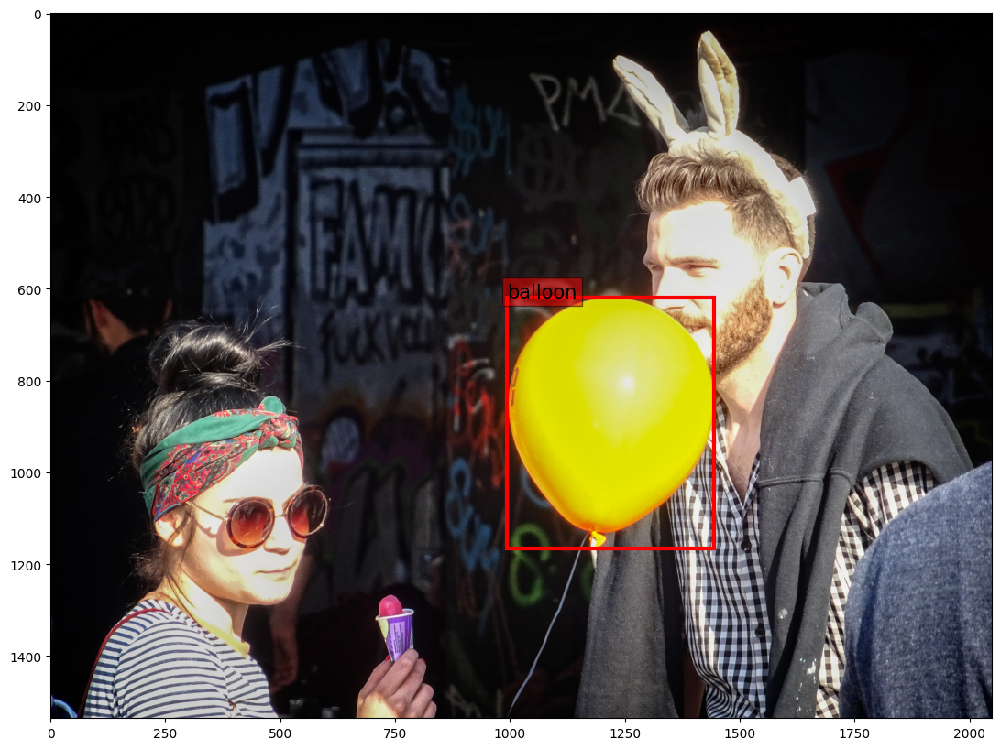

In [6]:
sample_idx = 0
sample = BalloonDatasetTrain[sample_idx]
BalloonDatasetTrain.show_data(sample_idx)

In [10]:
from torchvision.models import maxvit_t, MaxVit_T_Weights

weights = MaxVit_T_Weights.DEFAULT
model = maxvit_t(weights=weights)

/home/akaji/.local/lib/python3.10/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Downloading: "https://download.pytorch.org/models/maxvit_t-bc5ab103.pth" to /home/akaji/.cache/torch/hub/checkpoints/maxvit_t-bc5ab103.pth
100%|████████████████████████████████████████████████████████████████████████████████| 119M/119M [00:05<00:00, 23.1MB/s]


In [18]:
model.classifier

Sequential(
  (0): AdaptiveAvgPool2d(output_size=1)
  (1): Flatten(start_dim=1, end_dim=-1)
  (2): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
  (3): Linear(in_features=512, out_features=512, bias=True)
  (4): Tanh()
  (5): Linear(in_features=512, out_features=1000, bias=False)
)

In [19]:
model.classifier[-1] = nn.Linear(in_features=512, out_features=1, bias=True)
model.classifier

Sequential(
  (0): AdaptiveAvgPool2d(output_size=1)
  (1): Flatten(start_dim=1, end_dim=-1)
  (2): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
  (3): Linear(in_features=512, out_features=512, bias=True)
  (4): Tanh()
  (5): Linear(in_features=512, out_features=1, bias=True)
)

In [20]:
model

MaxVit(
  (stem): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(64, eps=0.001, momentum=0.99, affine=True, track_running_stats=True)
      (2): GELU(approximate='none')
    )
    (1): Conv2dNormActivation(
      (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    )
  )
  (blocks): ModuleList(
    (0): MaxVitBlock(
      (layers): ModuleList(
        (0): MaxVitLayer(
          (layers): Sequential(
            (MBconv): MBConv(
              (proj): Sequential(
                (0): AvgPool2d(kernel_size=3, stride=2, padding=1)
                (1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
              )
              (stochastic_depth): Identity()
              (layers): Sequential(
                (pre_norm): BatchNorm2d(64, eps=0.001, momentum=0.99, affine=True, track_running_stats=True)
                (conv_a): Conv2dNormActivation(
           

In [15]:
from torch import nn

In [17]:
nn.Linear(in_features=512, out_features=1, bias=True)

Linear(in_features=512, out_features=512, bias=True)